# 数据读取

In [32]:
# 核心 scverse 库
import scanpy as sc
import anndata as ad
import pandas as pd
import os
os.chdir(r"D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO")
print(os.getcwd())
# 数据检索
# import pooch

sc.settings.set_figure_params(dpi=300, facecolor="white")

targets = pd.read_csv("data/targets.csv")
targets

D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO


,group,SRR_id,filedirs
0,S12h,SRR26331708,data/SRR26331708_filtered_feature_bc_matrix.h5
1,S3h,SRR26331709,data/SRR26331709_filtered_feature_bc_matrix.h5
2,sham,SRR26331710,data/SRR26331710_filtered_feature_bc_matrix.h5
3,S3d,SRR26331711,data/SRR26331711_filtered_feature_bc_matrix.h5


In [33]:
adatas = {}

for idx,row in targets.iterrows():
    sample_adata = sc.read_10x_h5(row["filedirs"])
    sample_adata.var_names_make_unique()
    adatas[row["group"]] = sample_adata

adata = ad.concat(adatas, label="sample")
adata.obs_names_make_unique()
adata.var_names = pd.Series(adata.var_names).str.replace(r"\w+_","",regex=True)
adata.write("data/scdata_raw_PRJNA912889.h5ad")
adata

D:\Anaconda_envs\envs\bioinfo\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\Anaconda_envs\envs\bioinfo\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\Anaconda_envs\envs\bioinfo\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\Anaconda_envs\envs\bioinfo\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\Anaconda_envs\envs\bioinfo\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.v

AnnData object with n_obs × n_vars = 99679 × 72302
    obs: 'sample'

In [34]:
adata.var.head()

""
DDX11L2
MIR1302-2HG
FAM138A
ENSG00000290826
OR4F5


# 质量控制

In [35]:
%reset -f
import anndata as ad
import scanpy as sc
import numpy as np
import pandas as pd
import os
os.chdir(r"D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO")
print(os.getcwd())

adata = ad.read_h5ad("data/scdata_qc_PRJNA912889.h5ad")
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO


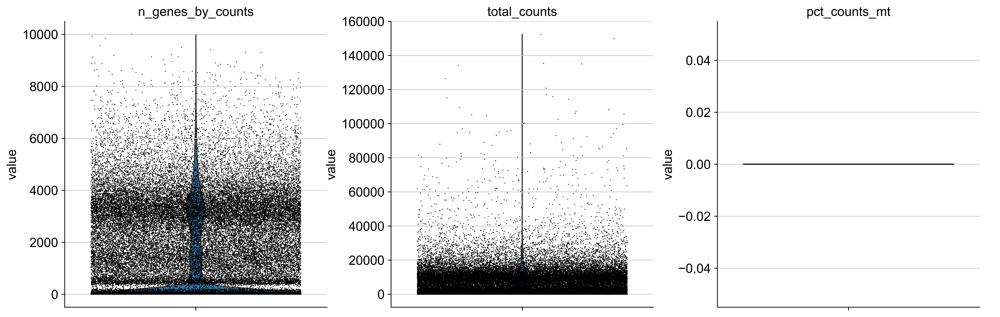

In [4]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

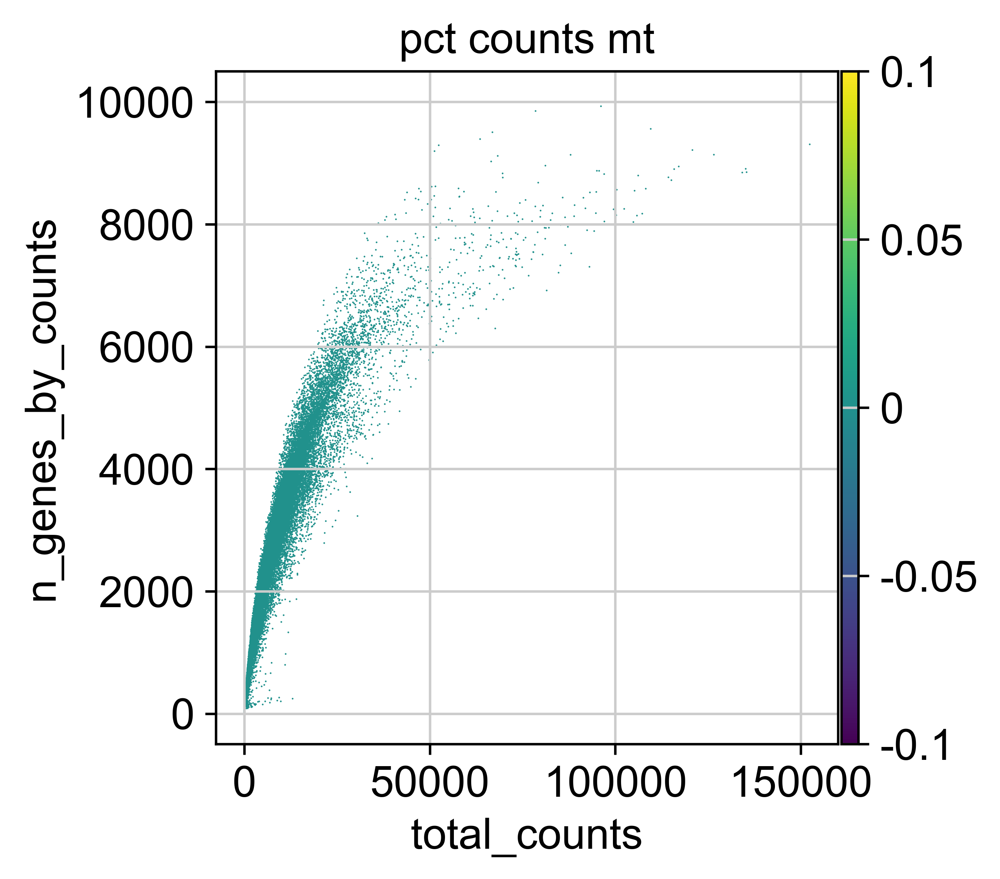

In [5]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [7]:
sc.pp.filter_cells(adata,
                   min_genes=200,
                   inplace=True)
sc.pp.filter_genes(adata,
                   min_cells=3,
                   inplace=True)
sc.pp.scrublet(adata, batch_key="sample")

In [8]:
adata.write("data/scdata_qc_PRJNA912889.h5ad")

# 归一化

In [2]:
%reset -f
import anndata as ad
import scanpy as sc
import numpy as np
import pandas as pd
import os
os.chdir(r"D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO")
print(os.getcwd())

adata = ad.read_h5ad("data/scdata_qc_PRJNA912889.h5ad")
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)
adata

D:\Python\bio_informatics\PRJNA912889+NextSeq6000+MCAO


AnnData object with n_obs × n_vars = 40444 × 27736
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet', 'log1p'
    layers: 'counts'

# 特征选择

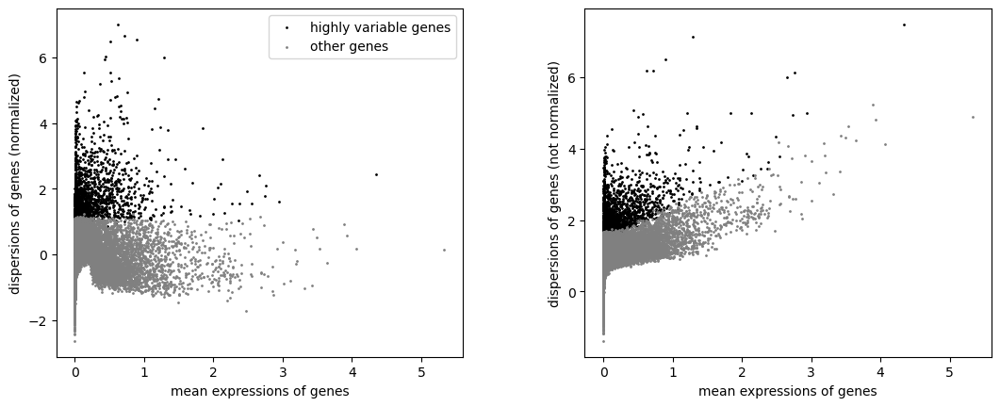

Index(['GRCh38_SDF4', 'GRCh38_AURKAIP1', 'GRCh38_GNB1', 'GRCh38_SKI',
       'GRCh38_RPL22', 'GRCh38_CAMTA1', 'GRCh38_PARK7', 'GRCh38_ERRFI1',
       'GRCh38_ENO1', 'GRCh38_KIF1B',
       ...
       'GRCm39_mt-Cytb', 'GRCm39_ENSMUSG00000079800',
       'GRCm39_ENSMUSG00000079190', 'GRCm39_ENSMUSG00000094915',
       'GRCm39_ENSMUSG00000079808', 'GRCm39_ENSMUSG00000095500',
       'GRCm39_Csprs', 'GRCm39_ENSMUSG00000096808',
       'GRCm39_ENSMUSG00000095742', 'GRCm39_ENSMUSG00000095041'],
      dtype='object', length=27736)

In [6]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample")
sc.pl.highly_variable_genes(adata)
adata.var_names

In [26]:
adata.var_names = pd.Series(adata.var_names).str.replace(r"\w+_","",regex=True)
adata.var

,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
SDF4,False,False,False,27,0.000271,0.000271,99.972913,27.0,3.332205,3,False,0.000658,1.180779,0.717587,1,False
AURKAIP1,False,False,False,107,0.001073,0.001073,99.892655,107.0,4.682131,3,False,0.001068,0.777460,0.222794,1,False
GNB1,False,False,False,144,0.001445,0.001444,99.855536,144.0,4.976734,6,True,0.001716,2.100631,1.664760,3,False
SKI,False,False,False,106,0.001083,0.001083,99.893659,108.0,4.691348,54,False,0.002440,0.841538,0.077253,1,False
RPL22,False,False,False,564,0.005758,0.005742,99.434184,574.0,6.354370,4,False,0.003719,1.267367,1.081106,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000095500,False,False,False,39,0.000391,0.000391,99.960874,39.0,3.688879,39,False,0.002732,0.816281,-0.005554,0,False
Csprs,False,False,False,39,0.000411,0.000411,99.960874,41.0,3.737670,39,False,0.001249,0.565927,-0.350316,0,False
ENSMUSG00000096808,False,False,False,65,0.000662,0.000662,99.934791,66.0,4.204693,65,False,0.001216,0.261077,-0.900359,0,False
ENSMUSG00000095742,False,False,False,870,0.008979,0.008939,99.127198,895.0,6.797940,868,False,0.020805,0.685822,-0.240605,0,False


# 降维

## PCA

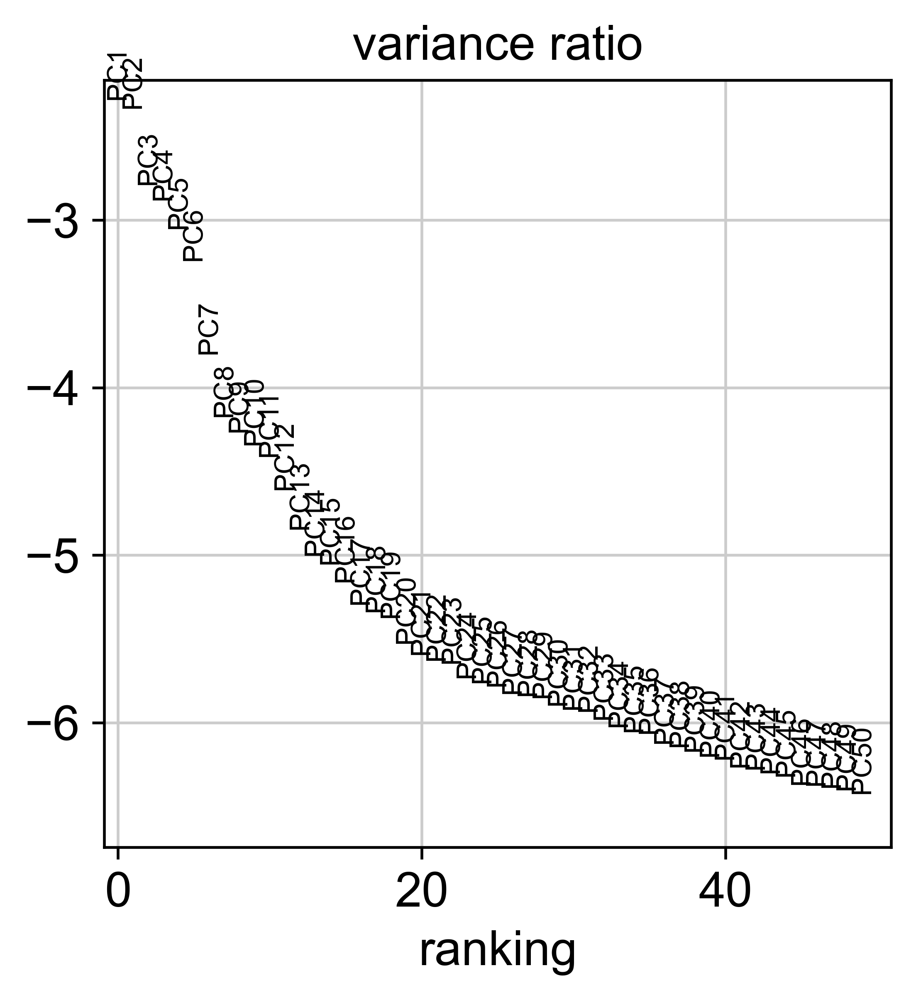

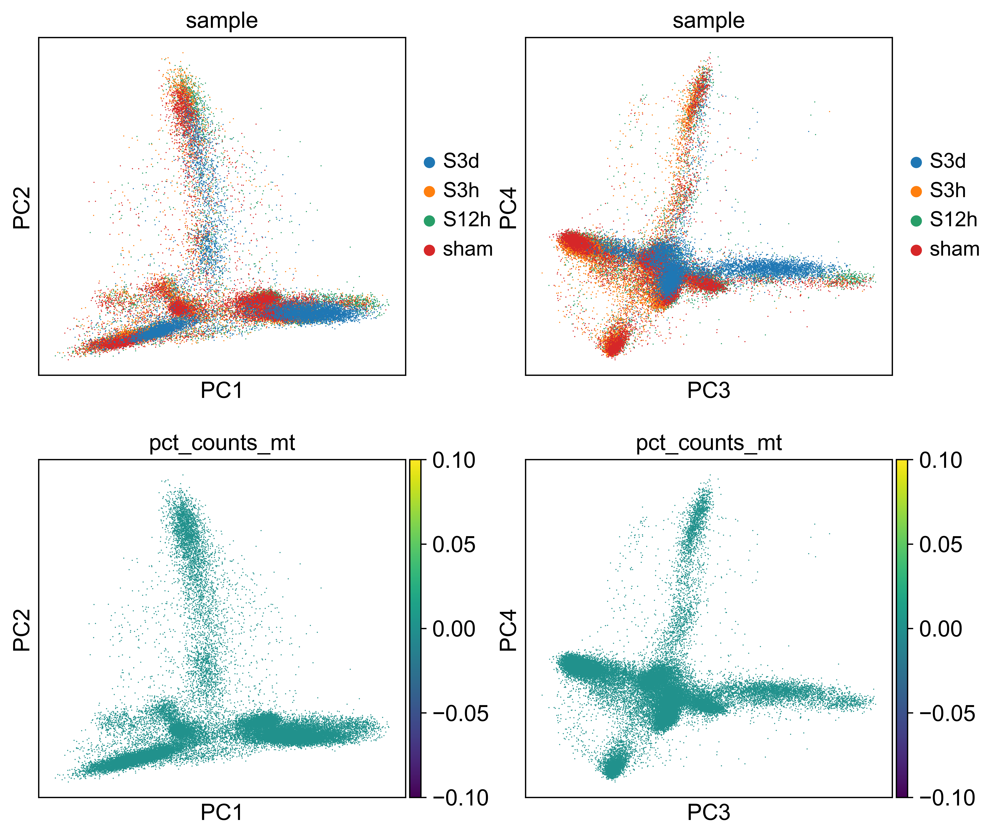

In [11]:
adata_cluster = sc.tl.pca(adata, copy=False)
sc.pl.pca_variance_ratio(adata_cluster, n_pcs=50, log=True)
sc.pl.pca(
    adata_cluster,
    color=["sample", "sample", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

## UMAP

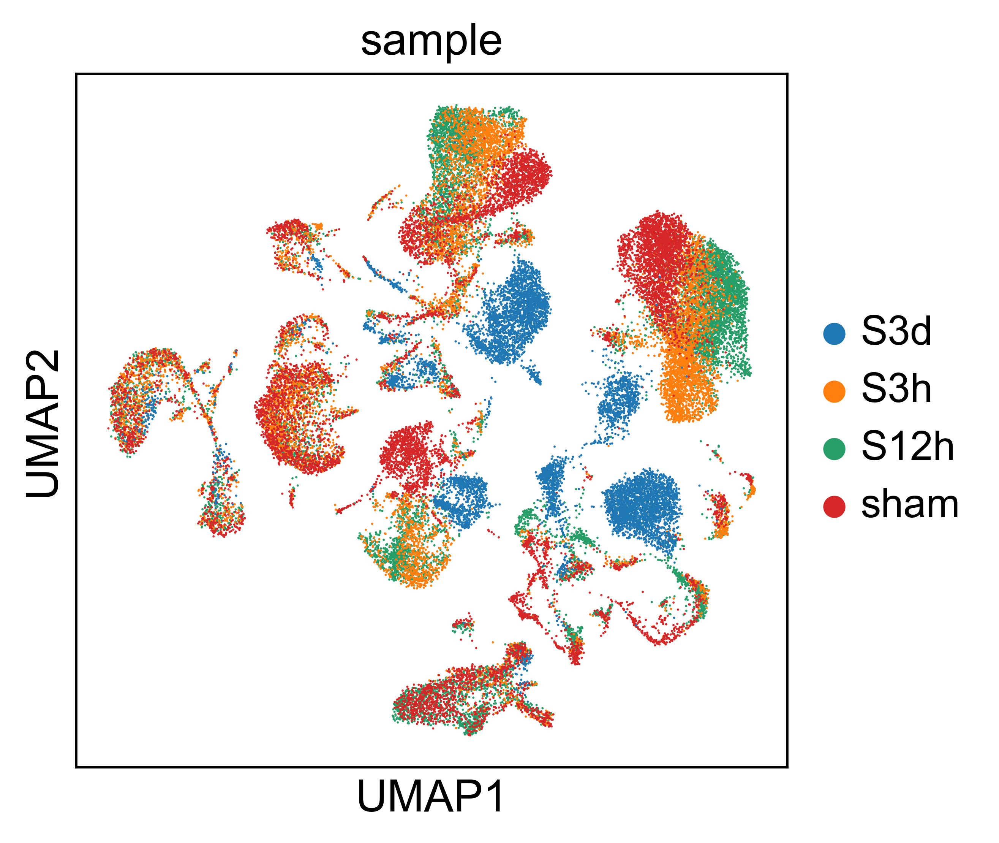

In [12]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color="sample",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

## t-SNE

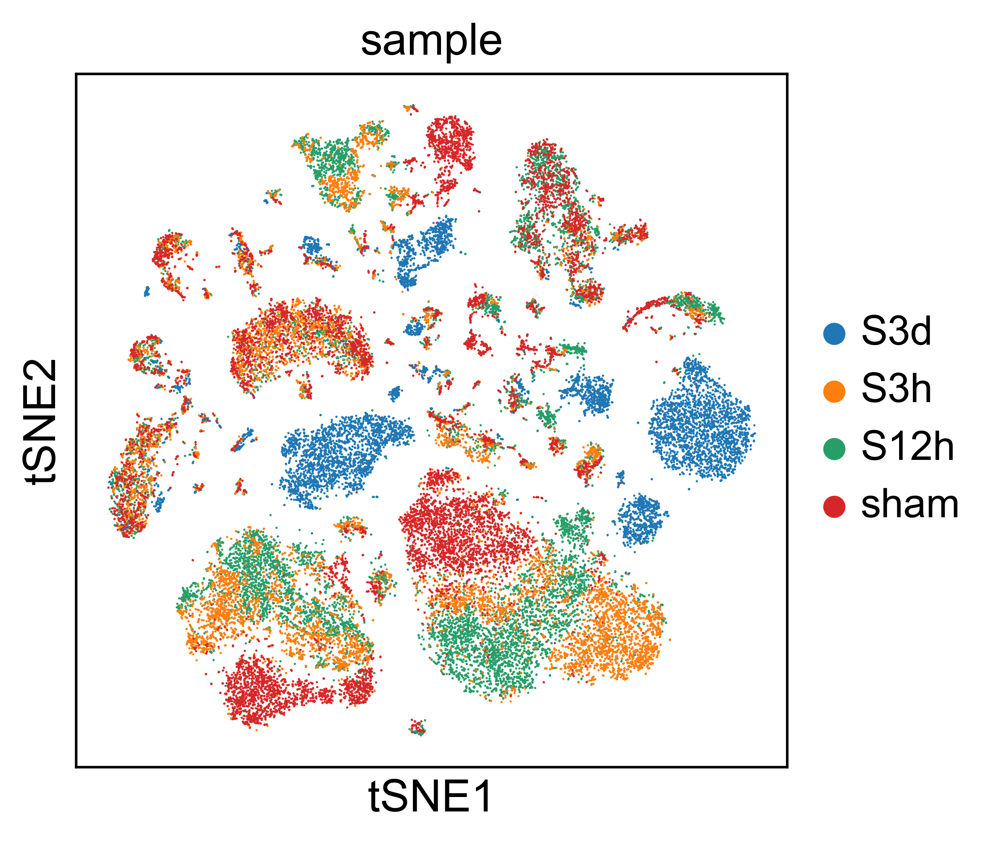

In [13]:
sc.tl.tsne(adata)
sc.pl.tsne(
    adata,
    color="sample",
    # Setting a smaller point size to get prevent overlap
    size=2,
    copy=False
)

In [1]:
adata

NameError: name 'adata' is not defined

# 分群：Clustering

In [ ]:
# 使用 igraph 实现和固定次数的迭代可以显着加快速度，尤其是对于较大的数据集
sc.tl.leiden(adata)
sc.pl.umap(adata, color=["leiden"])

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 780, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 1423, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (m

# 重新评估质量控制和细胞过滤结果

In [ ]:
# sc.pl.umap(
#     adata,
#     color=["leiden", "predicted_doublet", "doublet_score"],
#     # increase horizontal space between panels
#     wspace=0.5,
#     size=3,
# )